# Зайцев Александр ИУ5-62Б

# НИРС по дисциплине «Технологии машинного обучения»

# 1) Поиск и выбор набора данных для построения моделей машинного обучения. На основе выбранного набора данных студент должен построить модели машинного обучения для решения или задачи классификации, или задачи регрессии.

В качестве набора данных мы будем использовать датасет по распознаванию пола по голосу и анализу речи.

Будем решать задачу классификации. В качестве целевого признака возьмем колонку "label". Поскольку она содержит только значения male или female, которые будут закодированы на основе подхода LabelEncoding, то это задача бинарной клиссификации.

#### Импорт необходимых библиотек

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC, NuSVC, LinearSVC, OneClassSVM, SVR, NuSVR, LinearSVR
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from gmdhpy import gmdh

%matplotlib inline 
sns.set(style="ticks")

#### Загрузка данных

Загрузим файлы датасета с помощью библиотеки Pandas

In [2]:
data = pd.read_csv("voice.csv")
data

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,0.131884,0.084734,0.153707,0.049285,0.201144,0.151859,1.762129,6.630383,0.962934,0.763182,...,0.131884,0.182790,0.083770,0.262295,0.832899,0.007812,4.210938,4.203125,0.161929,female
3164,0.116221,0.089221,0.076758,0.042718,0.204911,0.162193,0.693730,2.503954,0.960716,0.709570,...,0.116221,0.188980,0.034409,0.275862,0.909856,0.039062,3.679688,3.640625,0.277897,female
3165,0.142056,0.095798,0.183731,0.033424,0.224360,0.190936,1.876502,6.604509,0.946854,0.654196,...,0.142056,0.209918,0.039506,0.275862,0.494271,0.007812,2.937500,2.929688,0.194759,female
3166,0.143659,0.090628,0.184976,0.043508,0.219943,0.176435,1.591065,5.388298,0.950436,0.675470,...,0.143659,0.172375,0.034483,0.250000,0.791360,0.007812,3.593750,3.585938,0.311002,female


In [3]:
# Удаление лишних столбцов
data = data.drop(['median', 'skew', 'kurt', 'centroid'], axis=1)

# 2) Проведение разведочного анализа данных. Построение графиков, необходимых для понимания структуры данных. Анализ и заполнение пропусков в данных.

In [4]:
# Первые пять строк набора данных
data.head()

,meanfreq,sd,Q25,Q75,IQR,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.015071,0.090193,0.075122,0.893369,0.491918,0.000000,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.019414,0.092666,0.073252,0.892193,0.513724,0.000000,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.008701,0.131908,0.123207,0.846389,0.478905,0.000000,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.096582,0.207955,0.111374,0.963322,0.727232,0.083878,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.078720,0.206045,0.127325,0.971955,0.783568,0.104261,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [5]:
# Размер датасета
data.shape

(3168, 17)

In [6]:
# Список колонок
data.columns

Index(['meanfreq', 'sd', 'Q25', 'Q75', 'IQR', 'sp.ent', 'sfm', 'mode',
       'meanfun', 'minfun', 'maxfun', 'meandom', 'mindom', 'maxdom', 'dfrange',
       'modindx', 'label'],
      dtype='object')

In [7]:
# Список колонок с типами данных 
data.dtypes

meanfreq    float64
sd          float64
Q25         float64
Q75         float64
IQR         float64
sp.ent      float64
sfm         float64
mode        float64
meanfun     float64
minfun      float64
maxfun      float64
meandom     float64
mindom      float64
maxdom      float64
dfrange     float64
modindx     float64
label        object
dtype: object

In [8]:
# Проверим наличие пропусков
data.isnull().sum()

meanfreq    0
sd          0
Q25         0
Q75         0
IQR         0
sp.ent      0
sfm         0
mode        0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

Датасет не содержит пропусков данных.

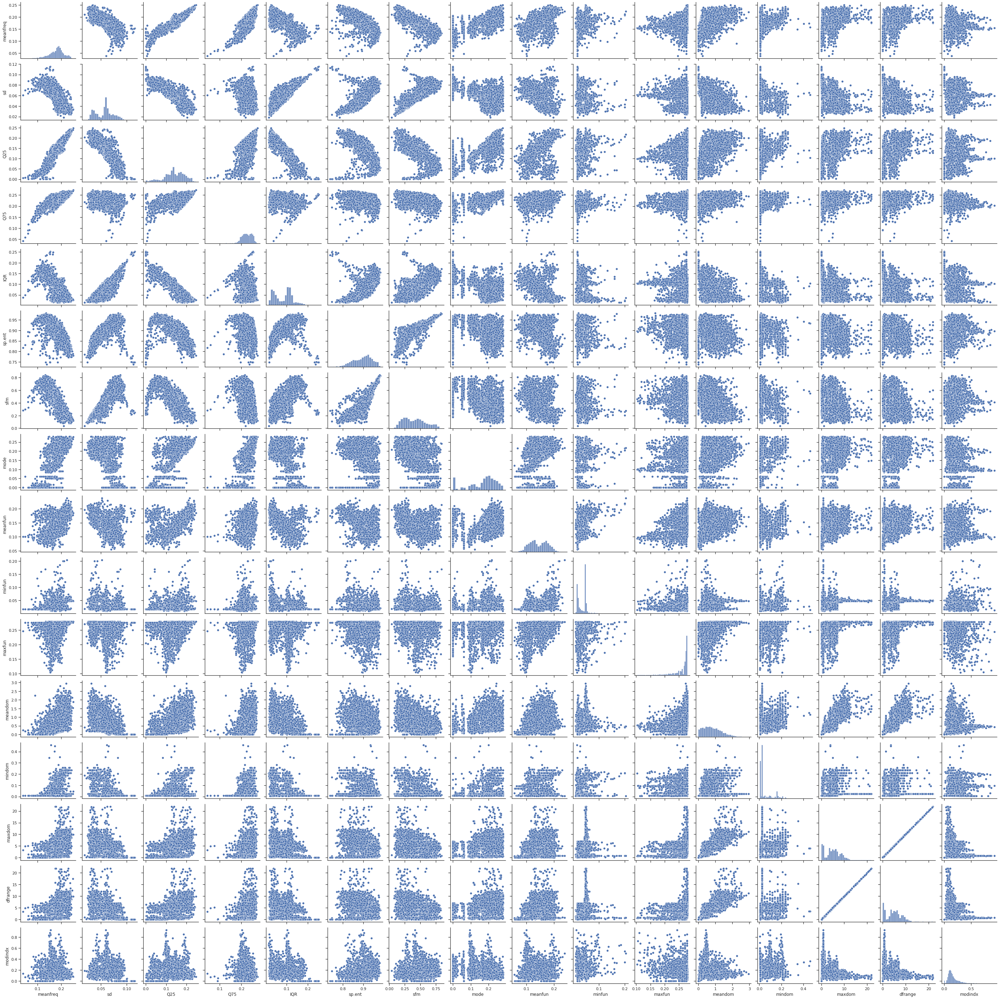

In [9]:
# Парные диаграммы
sns.pairplot(data)

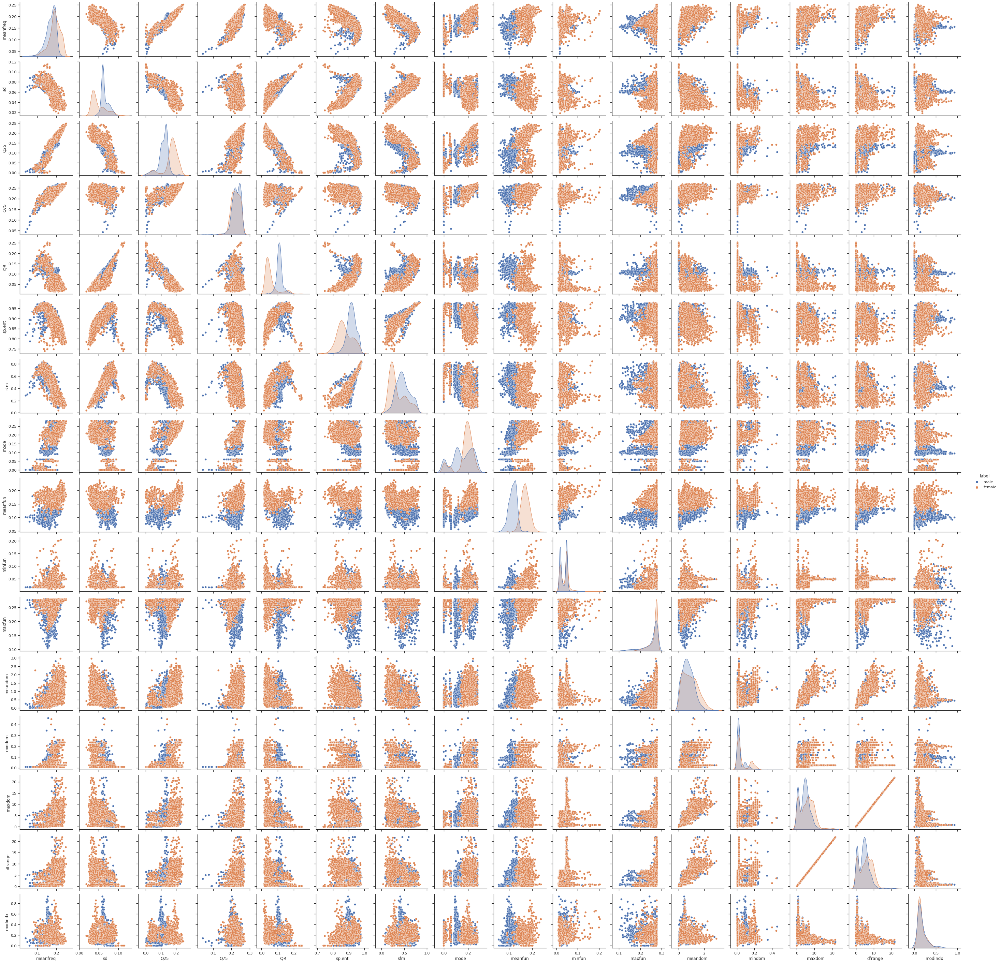

In [10]:
sns.pairplot(data, hue="label")

In [11]:
#Содержание целевого признака
data['label'].unique()

array(['male', 'female'], dtype=object)

In [12]:
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])
data

,meanfreq,sd,Q25,Q75,IQR,sp.ent,sfm,mode,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.015071,0.090193,0.075122,0.893369,0.491918,0.000000,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,1
1,0.066009,0.067310,0.019414,0.092666,0.073252,0.892193,0.513724,0.000000,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,1
2,0.077316,0.083829,0.008701,0.131908,0.123207,0.846389,0.478905,0.000000,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,1
3,0.151228,0.072111,0.096582,0.207955,0.111374,0.963322,0.727232,0.083878,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,1
4,0.135120,0.079146,0.078720,0.206045,0.127325,0.971955,0.783568,0.104261,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,0.131884,0.084734,0.049285,0.201144,0.151859,0.962934,0.763182,0.200836,0.182790,0.083770,0.262295,0.832899,0.007812,4.210938,4.203125,0.161929,0
3164,0.116221,0.089221,0.042718,0.204911,0.162193,0.960716,0.709570,0.013683,0.188980,0.034409,0.275862,0.909856,0.039062,3.679688,3.640625,0.277897,0
3165,0.142056,0.095798,0.033424,0.224360,0.190936,0.946854,0.654196,0.008006,0.209918,0.039506,0.275862,0.494271,0.007812,2.937500,2.929688,0.194759,0
3166,0.143659,0.090628,0.043508,0.219943,0.176435,0.950436,0.675470,0.212202,0.172375,0.034483,0.250000,0.791360,0.007812,3.593750,3.585938,0.311002,0


In [13]:
# Убедимся, что целевой признак для задачи бинарной классификации содержит только 0 и 1
data['label'].unique()

array([1, 0])

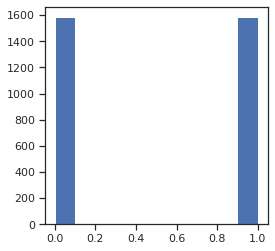

In [14]:
# Оценим дисбаланс классов для целевого признака
fig, ax = plt.subplots(figsize=(4,4)) 
plt.hist(data['label'])
plt.show()

In [15]:
data['label'].value_counts()

label
1    1584
0    1584
Name: count, dtype: int64

In [16]:
# Посчитаем дисбаланс классов
total = data.shape[0]
class_0, class_1 = data['label'].value_counts()
print('Класс 0 составляет {}%, а класс 1 составляет {}%.'
      .format(round(class_0 / total, 2)*100, round(class_1 / total, 2)*100))

Класс 0 составляет 50.0%, а класс 1 составляет 50.0%.


Дисбаланс классов отсутствует.

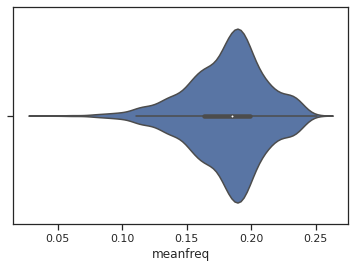

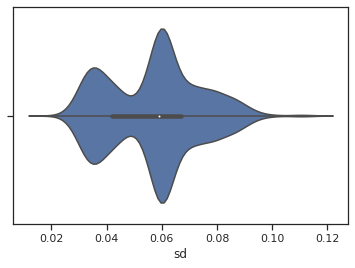

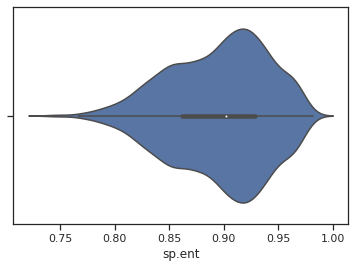

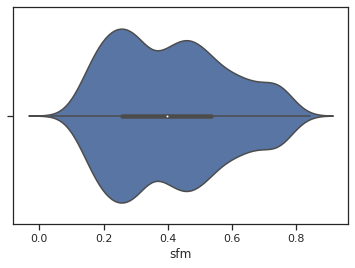

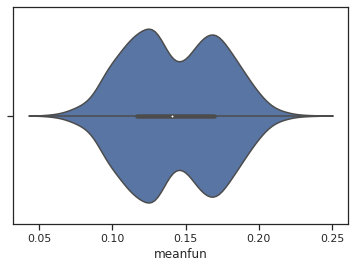

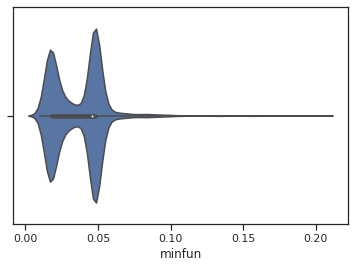

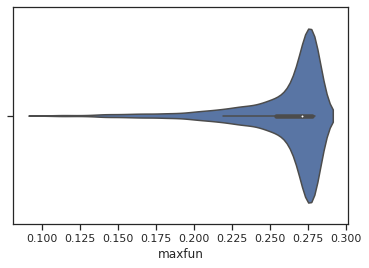

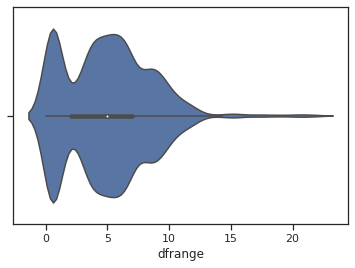

In [17]:
# Скрипичные диаграммы для некоторых числовых колонок
for col in ['meanfreq', 'sd', 'sp.ent', 'sfm', 'meanfun', 'minfun', 'maxfun', 'dfrange']:
    sns.violinplot(x=data[col])
    plt.show()

# 3) Выбор признаков, подходящих для построения моделей. Кодирование категориальных признаков. Масштабирование данных. Формирование вспомогательных признаков, улучшающих качество моделей.

In [18]:
data.dtypes

meanfreq    float64
sd          float64
Q25         float64
Q75         float64
IQR         float64
sp.ent      float64
sfm         float64
mode        float64
meanfun     float64
minfun      float64
maxfun      float64
meandom     float64
mindom      float64
maxdom      float64
dfrange     float64
modindx     float64
label         int64
dtype: object

Для построения моделей будем использовать все признаки.

Категориальные признаки отсутствуют, их кодирования не требуется. Исключением является признак label, но мы уже его закодировали на основе подхода LabelEncoding.

Вспомогательные признаки для улучшения качества моделей мы строить не будем.

Выполним масштабирование данных.

In [19]:
# Числовые колонки для масштабирования
scale_cols = ['meanfreq', 'sd', 'Q25', 'Q75', 'IQR', 'sp.ent', 'sfm', 'mode',
       'meanfun', 'minfun', 'maxfun', 'meandom', 'mindom', 'maxdom', 'dfrange',
       'modindx']

In [20]:
sc = MinMaxScaler()
sc_data = sc.fit_transform(data[scale_cols])

In [21]:
# Добавим масштабированные данные в набор данных
for i in range(len(scale_cols)):
    col = scale_cols[i]
    new_col_name = col + '_scaled'
    data[new_col_name] = sc_data[:,i]

In [22]:
data.head()

,meanfreq,sd,Q25,Q75,IQR,sp.ent,sfm,mode,meanfun,minfun,...,sfm_scaled,mode_scaled,meanfun_scaled,minfun_scaled,maxfun_scaled,meandom_scaled,mindom_scaled,maxdom_scaled,dfrange_scaled,modindx_scaled
0,0.059781,0.064241,0.015071,0.090193,0.075122,0.893369,0.491918,0.000000,0.084279,0.015702,...,0.564526,0.000000,0.157706,0.030501,0.981526,0.000000,0.006452,0.000000,0.000000,0.000000
1,0.066009,0.067310,0.019414,0.092666,0.073252,0.892193,0.513724,0.000000,0.107937,0.015826,...,0.591578,0.000000,0.287642,0.031140,0.834600,0.000407,0.006452,0.002144,0.002146,0.056449
2,0.077316,0.083829,0.008701,0.131908,0.123207,0.846389,0.478905,0.000000,0.098706,0.015656,...,0.548382,0.000000,0.236945,0.030264,0.954963,0.000060,0.006452,0.000357,0.000358,0.049885
3,0.151228,0.072111,0.096582,0.207955,0.111374,0.963322,0.727232,0.083878,0.088965,0.017798,...,0.856457,0.299565,0.183442,0.041287,0.834600,0.065659,0.006452,0.025375,0.025393,0.265043
4,0.135120,0.079146,0.078720,0.206045,0.127325,0.971955,0.783568,0.104261,0.106398,0.016931,...,0.926348,0.372362,0.279190,0.036829,0.929285,0.238994,0.006452,0.250536,0.250715,0.223380


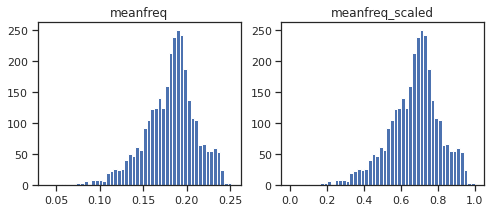

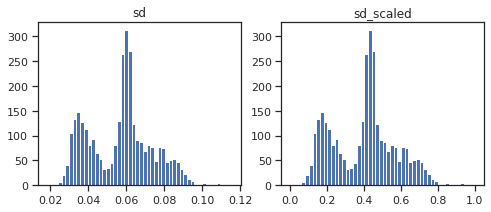

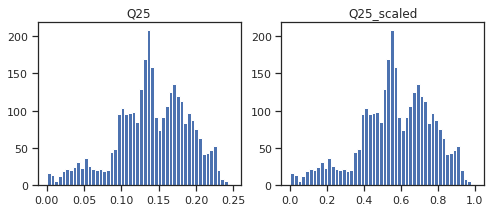

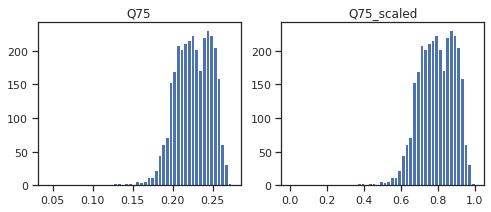

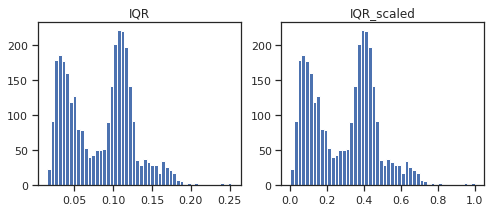

...

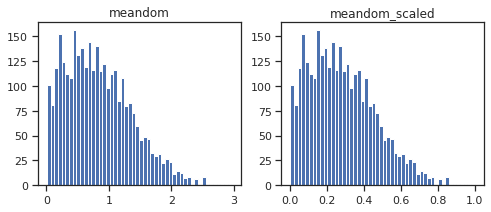

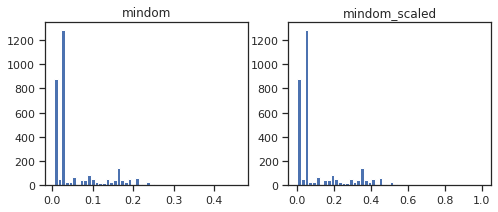

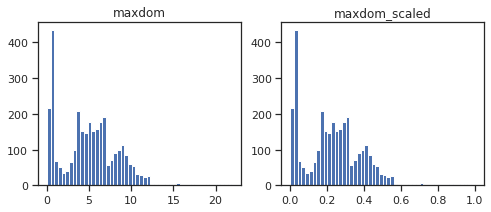

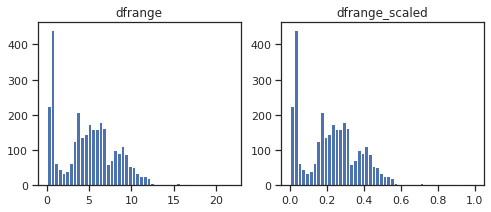

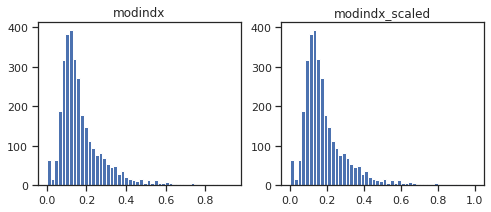

In [23]:
# Проверим, что масштабирование не повлияло на распределение данных
for col in scale_cols:
    col_scaled = col + '_scaled'

    fig, ax = plt.subplots(1, 2, figsize=(8,3))
    ax[0].hist(data[col], 50)
    ax[1].hist(data[col_scaled], 50)
    ax[0].title.set_text(col)
    ax[1].title.set_text(col_scaled)
    plt.show()

# 4) Проведение корреляционного анализа данных. Формирование промежуточных выводов о возможности построения моделей машинного обучения. В зависимости от набора данных, порядок выполнения пунктов 2, 3, 4 может быть изменен.

In [24]:
corr_cols_1 = scale_cols + ['label']
corr_cols_1

['meanfreq',
 'sd',
 'Q25',
 'Q75',
 'IQR',
 'sp.ent',
 'sfm',
 'mode',
 'meanfun',
 'minfun',
 'maxfun',
 'meandom',
 'mindom',
 'maxdom',
 'dfrange',
 'modindx',
 'label']

In [25]:
scale_cols_postfix = [x+'_scaled' for x in scale_cols]
corr_cols_2 = scale_cols_postfix + ['label']
corr_cols_2

['meanfreq_scaled',
 'sd_scaled',
 'Q25_scaled',
 'Q75_scaled',
 'IQR_scaled',
 'sp.ent_scaled',
 'sfm_scaled',
 'mode_scaled',
 'meanfun_scaled',
 'minfun_scaled',
 'maxfun_scaled',
 'meandom_scaled',
 'mindom_scaled',
 'maxdom_scaled',
 'dfrange_scaled',
 'modindx_scaled',
 'label']

<AxesSubplot:>

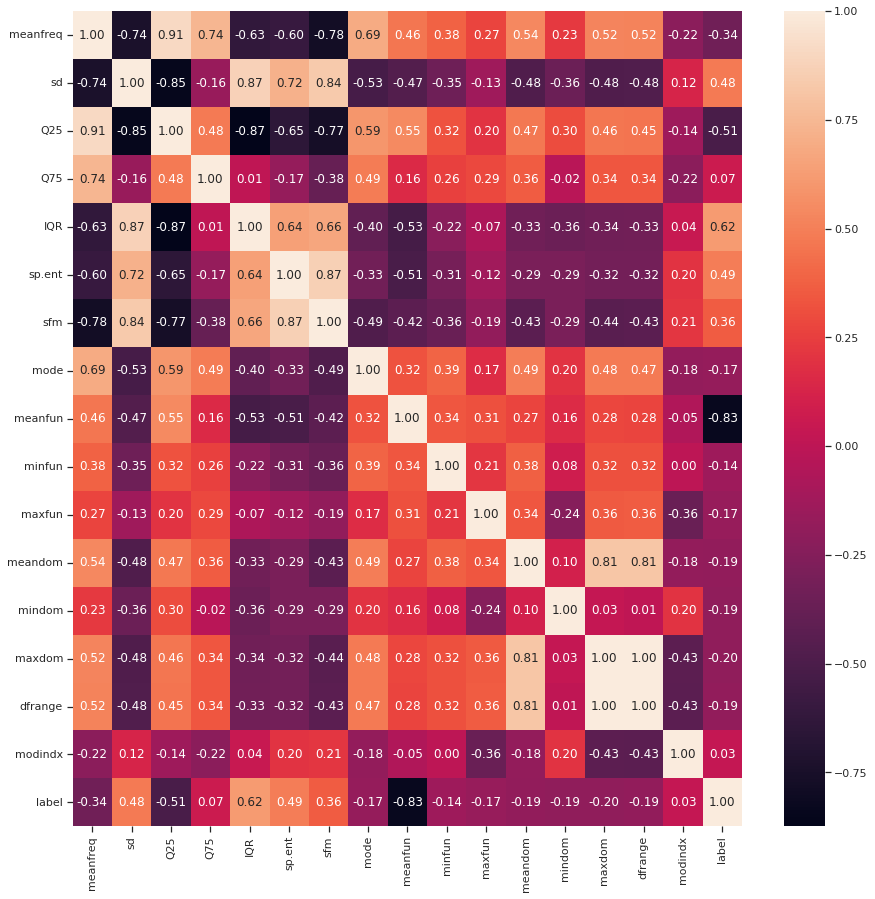

In [26]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(data[corr_cols_1].corr(), annot=True, fmt='.2f')

<AxesSubplot:>

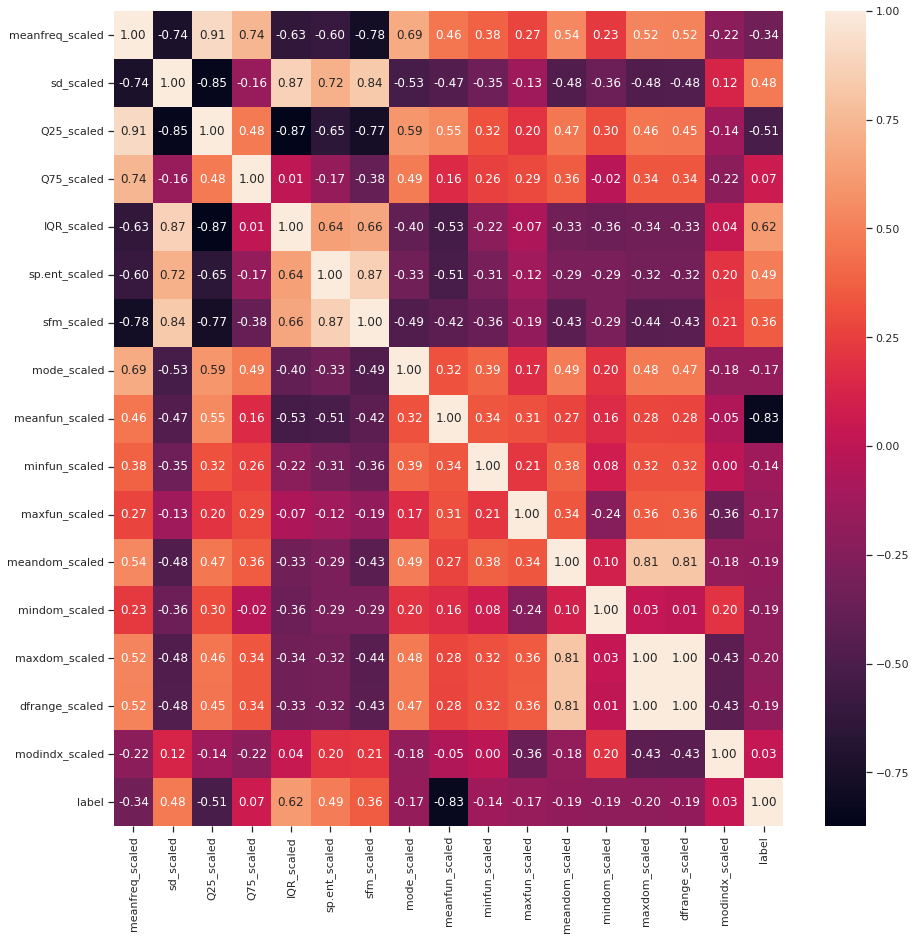

In [27]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(data[corr_cols_2].corr(), annot=True, fmt='.2f')

На основе корреляционной матрицы можно сделать следующие выводы:

* Корреляционные матрицы для исходных и масштабированных данных совпадают.
* Целевой признак классификации "label" наиболее сильно коррелирует с "IQR" (0.62), "sp.ent" (0.49) и "sd" (0.48). Эти признаки обязательно следует оставить в модели классификации.
* Признаки "Q75" и "modindx" имеют слабую корреляцию с целевым признаком, поэтому оба признака можно не включать. 
* Большие по модулю значения коэффициентов корреляции свидетельствуют о значимой корреляции между исходными признаками и целевым признаком. На основании корреляционной матрицы можно сделать вывод о том, что данные позволяют построить модель машинного обучения. 

# 5) Выбор метрик для последующей оценки качества моделей. Необходимо выбрать не менее трех метрик и обосновать выбор.

1. Метрика accuracy (доля верных классификаций) - показывает отношения правильных предсказаний модели ко всем.
2. Метрика precision (точность) - это отношение tp / (tp + fp). Доля верно предсказанных классификатором положительных объектов, из всех объектов, которые классификатор верно или неверно определил как положительные.
3. Метрика recall (полнота) - это отношение tp / (tp + fn). Доля верно предсказанных классификатором положительных объектов, из всех действительно положительных объектов.
4. Метрика F1-мера - для того, чтобы объединить precision и recall в единую метрику используется F-мера, которая вычисляется как среднее гармоническое от precision и recall.

Разработаем класс, который позволит сохранять метрики качества построенных моделей и реализует визуализацию метрик качества.

In [28]:
class MetricLogger:
    
    def __init__(self):
        self.df = pd.DataFrame(
            {'metric': pd.Series([], dtype='str'),
            'alg': pd.Series([], dtype='str'),
            'value': pd.Series([], dtype='float')})

    def add(self, metric, alg, value):
        """
        Добавление значения
        """
        # Удаление значения если оно уже было ранее добавлено
        self.df.drop(self.df[(self.df['metric']==metric)&(self.df['alg']==alg)].index, inplace = True)
        # Добавление нового значения
        temp = [{'metric':metric, 'alg':alg, 'value':value}]
        temp_df = pd.DataFrame(temp)
        self.df = pd.concat([self.df, temp_df], ignore_index=True)

    def get_data_for_metric(self, metric, ascending=True):
        """
        Формирование данных с фильтром по метрике
        """
        temp_data = self.df[self.df['metric']==metric]
        temp_data_2 = temp_data.sort_values(by='value', ascending=ascending)
        return temp_data_2['alg'].values, temp_data_2['value'].values
    
    def plot(self, str_header, metric, ascending=True, figsize=(5, 5)):
        """
        Вывод графика
        """
        array_labels, array_metric = self.get_data_for_metric(metric, ascending)
        fig, ax1 = plt.subplots(figsize=figsize)
        pos = np.arange(len(array_metric))
        rects = ax1.barh(pos, array_metric,
                         align='center',
                         height=0.5, 
                         tick_label=array_labels)
        ax1.set_title(str_header)
        for a,b in zip(pos, array_metric):
            plt.text(0.5, a-0.05, str(round(b,3)), color='white')
        plt.show()

# 6) Выбор наиболее подходящих моделей для решения задачи классификации или регрессии. Необходимо использовать не менее пяти моделей, две из которых должны быть ансамблевыми.

Для задачи классификации будем использовать следующие модели:
1. Метод K-ближайших соседей (KNeighborsClassifier);
2. Метод опорных векторов (SVM);
3. Деревья решений (Desicion Tree);
4. Случайный лес (Random Forest);
5. Градиентный бустинг (Gradient Boosting).

# 7) Формирование обучающей и тестовой выборок на основе исходного набора данных.

In [29]:
# Признаки для задачи классификации
class_cols = ['meanfreq_scaled', 'sd_scaled', 'Q25_scaled', 'IQR_scaled', 'sp.ent_scaled', 
              'sfm_scaled', 'mode_scaled', 'meanfun_scaled', 'minfun_scaled', 'maxfun_scaled', 
              'meandom_scaled', 'mindom_scaled', 'maxdom_scaled', 'dfrange_scaled']

In [30]:
X = data[class_cols]
y = data['label']
X.shape

(3168, 14)

Разделим выборку на обучающую и тестовую

In [31]:
# С использованием метода train_test_split разделим выборку на обучающую и тестовую
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)

X_train: (2376, 14)
X_test: (792, 14)
y_train: (2376,)
y_test: (792,)


# 8) Построение базового решения (baseline) для выбранных моделей без подбора гиперпараметров. Производится обучение моделей на основе обучающей выборки и оценка качества моделей на основе тестовой выборки.

In [32]:
# Модели
models = {'Метод K-ближайших соседей':KNeighborsClassifier(),
          'Метод опорных векторов':SVC(),
          'Деревья решений':DecisionTreeClassifier(),
          'Случайный лес':RandomForestClassifier(),
          'Градиентный бустинг':GradientBoostingClassifier()}

In [33]:
# Сохранение метрик
metricLogger = MetricLogger()

In [34]:
def test_model(model_name, model, metricLogger):
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        metricLogger.add('accuracy', model_name, accuracy_score(y_test, y_pred))
        metricLogger.add('recall', model_name, recall_score(y_test, y_pred))
        metricLogger.add('precision', model_name, precision_score(y_test, y_pred))
        metricLogger.add('f1', model_name, f1_score(y_test, y_pred))        
        
        
        print('Модель для классификации - {}'.format(model))            
        print('Accuracy: ', accuracy_score(y_test, y_pred))
        print('R:        ', precision_score(y_test, y_pred))
        print('P:        ', recall_score(y_test, y_pred))
        print('F1:       ', f1_score(y_test, y_pred))  
        print('=============================')

In [35]:
for model_name, model in models.items():
    test_model(model_name, model, metricLogger)

Модель для классификации - KNeighborsClassifier()
Accuracy:  0.9810606060606061
R:         0.9776674937965261
P:         0.985
F1:        0.9813200498132004
Модель для классификации - SVC()
Accuracy:  0.9797979797979798
R:         0.98
P:         0.98
F1:        0.98
Модель для классификации - DecisionTreeClassifier()
Accuracy:  0.9772727272727273
R:         0.9798994974874372
P:         0.975
F1:        0.9774436090225564
Модель для классификации - RandomForestClassifier()
Accuracy:  0.9835858585858586
R:         0.9874055415617129
P:         0.98
F1:        0.9836888331242158
Модель для классификации - GradientBoostingClassifier()
Accuracy:  0.9772727272727273
R:         0.9798994974874372
P:         0.975
F1:        0.9774436090225564


# 9) Подбор гиперпараметров для выбранных моделей. Рекомендуется использовать методы кросс-валидации. В зависимости от используемой библиотеки можно применять функцию GridSearchCV, использовать перебор параметров в цикле, или использовать другие методы.

In [36]:
def model(model, title, parameters):
    
        model_grid = GridSearchCV(model, parameters, cv = 5, scoring = 'accuracy')
        model_grid.fit(X_train, y_train)
               
        print('Модель для классификации -', title)
        print('==================================================')
        print(model_grid.best_estimator_)
        print('Лучшее значение параметра модели:', model_grid.best_params_)

In [37]:
model(KNeighborsClassifier(), 'Метод K-ближайших соседей', 
      {'n_neighbors': np.arange(1,50,2)})

Модель для классификации - Метод K-ближайших соседей
KNeighborsClassifier(n_neighbors=3)
Лучшее значение параметра модели: {'n_neighbors': 3}


In [38]:
model(SVC(), 'Метод опорных векторов', 
      {'gamma':np.arange(1,50,2)})

Модель для классификации - Метод опорных векторов
SVC(gamma=7)
Лучшее значение параметра модели: {'gamma': 7}


In [39]:
model(DecisionTreeClassifier(), 'Деревья решений', 
      {'criterion':['gini', 'entropy']})

Модель для классификации - Деревья решений
DecisionTreeClassifier(criterion='entropy')
Лучшее значение параметра модели: {'criterion': 'entropy'}


In [40]:
model(RandomForestClassifier(), 'Случайный лес', 
      {'n_estimators':np.arange(1,50,2)})

Модель для классификации - Случайный лес
RandomForestClassifier(n_estimators=39)
Лучшее значение параметра модели: {'n_estimators': 39}


In [41]:
model(GradientBoostingClassifier(), 'Градиентный бустинг', 
      {'n_estimators':np.arange(1,100,5)})

Модель для классификации - Градиентный бустинг
GradientBoostingClassifier(n_estimators=86)
Лучшее значение параметра модели: {'n_estimators': 86}


# 10) Повторение пункта 8 для найденных оптимальных значений гиперпараметров. Сравнение качества полученных моделей с качеством baseline-моделей.

In [42]:
# Модели
models_best = {'Метод K-ближайших соседей':KNeighborsClassifier(n_neighbors=3),
               'Метод опорных векторов':SVC(gamma = 7),
               'Деревья решений':DecisionTreeClassifier(criterion = 'entropy'),
               'Случайный лес':RandomForestClassifier(n_estimators = 31),
               'Градиентный бустинг':GradientBoostingClassifier(n_estimators = 71)}

In [43]:
for model_name, model in models_best.items():
    test_model(model_name, model, metricLogger)

Модель для классификации - KNeighborsClassifier(n_neighbors=3)
Accuracy:  0.9835858585858586
R:         0.9801488833746899
P:         0.9875
F1:        0.9838107098381071
Модель для классификации - SVC(gamma=7)
Accuracy:  0.9823232323232324
R:         0.9873737373737373
P:         0.9775
F1:        0.9824120603015074
Модель для классификации - DecisionTreeClassifier(criterion='entropy')
Accuracy:  0.9659090909090909
R:         0.9697732997481109
P:         0.9625
F1:        0.9661229611041406
Модель для классификации - RandomForestClassifier(n_estimators=31)
Accuracy:  0.9823232323232324
R:         0.9873737373737373
P:         0.9775
F1:        0.9824120603015074
Модель для классификации - GradientBoostingClassifier(n_estimators=71)
Accuracy:  0.9797979797979798
R:         0.9848484848484849
P:         0.975
F1:        0.9798994974874371


# 11) Формирование выводов о качестве построенных моделей на основе выбранных метрик. Результаты сравнения качества рекомендуется отобразить в виде графиков и сделать выводы в форме текстового описания. Рекомендуется построение графиков обучения и валидации, влияния значений гиперпарметров на качество моделей и т.д.

In [44]:
# Метрики качества модели
metrics = metricLogger.df['metric'].unique()
metrics

array(['accuracy', 'recall', 'precision', 'f1'], dtype=object)

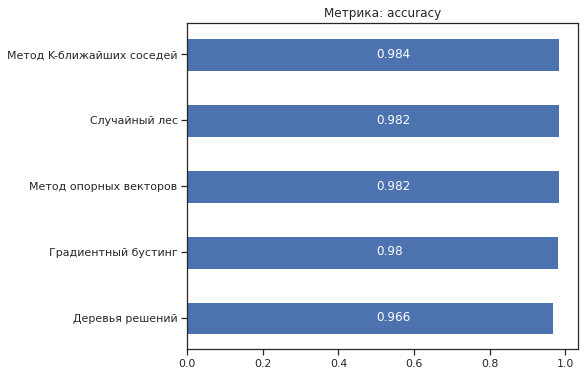

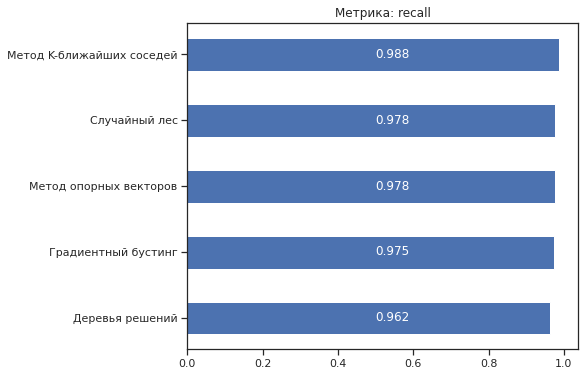

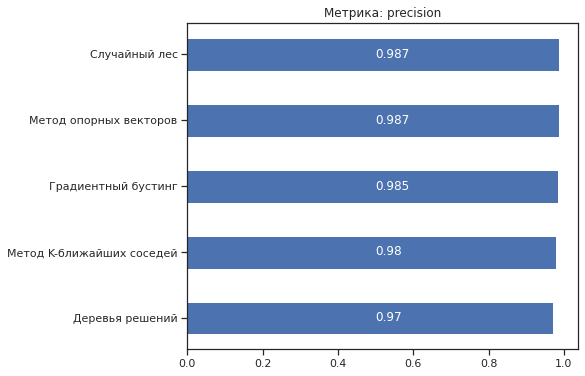

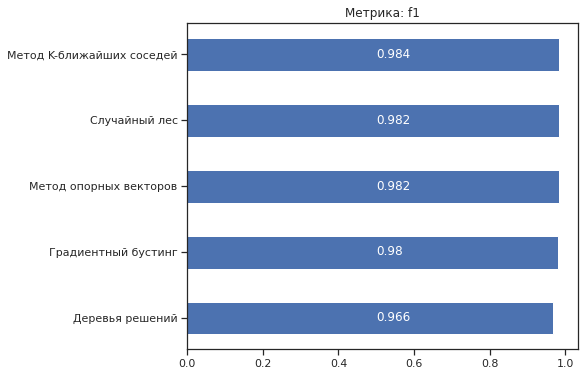

In [45]:
# Построим графики метрик качества модели
for metric in metrics:
    metricLogger.plot('Метрика: ' + metric, metric, figsize=(7, 6))